In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from galpy.util import coords
from galpy.util import conversion
from scipy import ndimage as nd
from scipy.stats import binned_statistic,binned_statistic_2d
import cmasher as cmr
import astropy.table as at
from astropy import units as u
import warnings
from astropy.coordinates import SkyCoord
%pylab inline

%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib


# Read in Gaia DR3 RVS data file for all plots below. 

Actions calculated by Adrian Price-Whelan in MilkyWayPotential2022 from Gala. File available at 10.5281/zenodo.14609059

In [2]:
warnings.filterwarnings('ignore')
gaia = at.QTable.read('GaiaDR3')

Transform to cylindrical coordinates using astropy's SkyCoord

In [3]:
c = SkyCoord(x=gaia['xyz'][:,0], y=gaia['xyz'][:,1], z=gaia['xyz'][:,2],
             v_x=gaia['vxyz'][:,0], v_y=gaia['vxyz'][:,1], v_z=gaia['vxyz'][:,2], representation_type='cartesian')
cyl=c.cylindrical
cyl_vel=cyl.differentials
rpz=[cyl.rho.value,
     cyl.phi.rad,
     gaia['xyz'][:,2].value]
vcyl=[cyl_vel['s'].d_rho.value,
      (cyl.rho * cyl_vel['s'].d_phi).to(u.km/u.s, u.dimensionless_angles()).value,
      gaia['vxyz'][:,2].value]
ro,vo=8.2,235.

## Figure 7 ($v_R-v_\phi$ in the Solar neighbourhood)

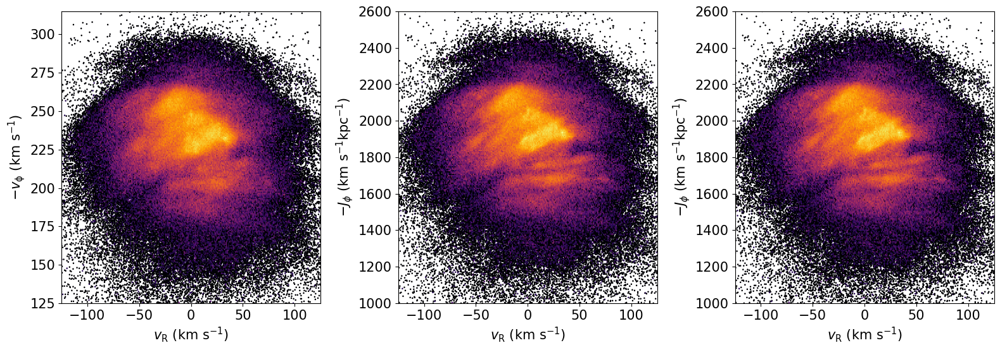

In [4]:
f, ((ax1,ax2,ax3)) = plt.subplots(1, 3,figsize=(19,6))

f7_indx=(gaia['parallax_over_error']>10)*((1./gaia['parallax'].value)<0.2)

ax1.hexbin(vcyl[0][f7_indx],-vcyl[1][f7_indx],extent=[-125,125,125,315],mincnt=1,bins='log',cmap='inferno',gridsize=400,rasterized=True)
ax2.hexbin(vcyl[0][f7_indx],-gaia['actions'][:,1].value[f7_indx],extent=[-125,125,1000,2600],mincnt=1,bins='log',cmap='inferno',gridsize=400,rasterized=True)
ax3.hexbin(vcyl[0][f7_indx],-gaia['actions'][:,1].value[f7_indx],extent=[-125,125,1000,2600],mincnt=1,bins='log',cmap='inferno',gridsize=400,rasterized=True)

ax1.set_xlim(-125,125)
ax2.set_xlim(-125,125)
ax3.set_xlim(-125,125)
ax1.set_ylim(125,315)
ax2.set_ylim(1000,2600)
ax3.set_ylim(1000,2600)

ax1.set_xlabel(r'$v_{\mathrm{R}}\ (\mathrm{km\ s}^{-1})$',fontsize=15)
ax2.set_xlabel(r'$v_{\mathrm{R}}\ (\mathrm{km\ s}^{-1})$',fontsize=15)
ax3.set_xlabel(r'$v_{\mathrm{R}}\ (\mathrm{km\ s}^{-1})$',fontsize=15)
ax1.set_ylabel(r'$-v_{\mathrm{\phi}}\ (\mathrm{km\ s}^{-1})$',fontsize=15)
ax2.set_ylabel(r'$-J_{\phi}\ (\mathrm{km\ s}^{-1}\mathrm{kpc}^{-1})$',fontsize=15)
ax3.set_ylabel(r'$-J_{\phi}\ (\mathrm{km\ s}^{-1}\mathrm{kpc}^{-1})$',fontsize=15)
ax1.tick_params(labelsize=15)
ax2.tick_params(labelsize=15)
ax3.tick_params(labelsize=15)

plt.subplots_adjust(wspace=0.3)
plt.subplots_adjust(hspace=0.3)

#plt.savefig('fig7_moving_groups_solar_neighbourhood.pdf',bbox_inches='tight')

plt.show()

## Figure 8 (Ridges in $R-v_\phi$)

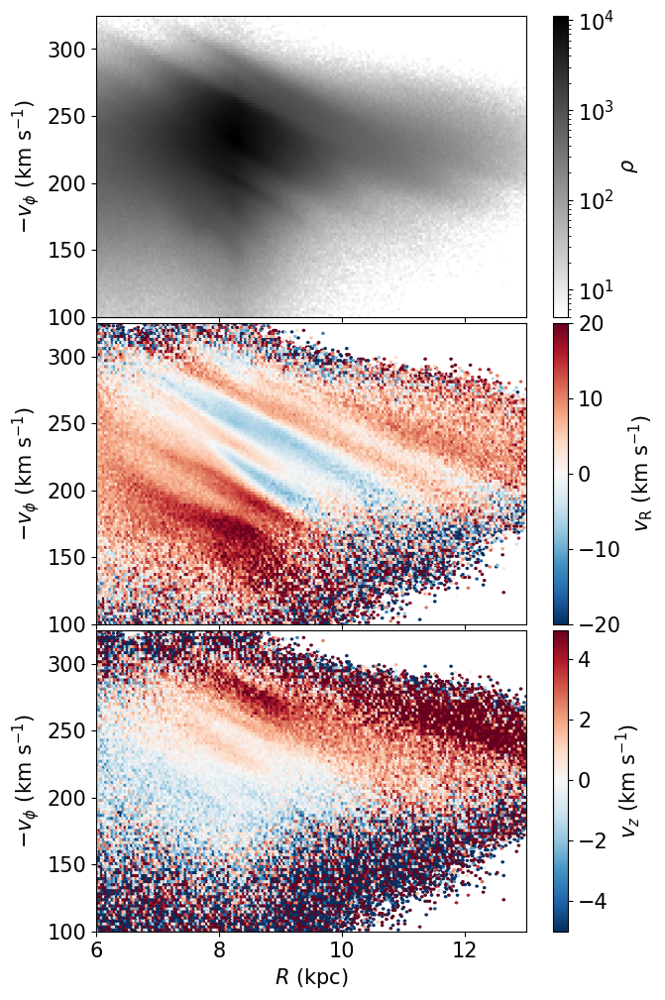

In [5]:
f, ((ax1),(ax2),(ax3)) = plt.subplots(3, 1,figsize=(7,12), sharex=True)

hexsize=[200,100]

f8_indx=(gaia['parallax_over_error']>10)*(np.fabs(rpz[1])-np.pi<0.1)

a1=ax1.hexbin(rpz[0][f8_indx],-vcyl[1][f8_indx],bins='log',rasterized=True,extent=[6,13,100,325],mincnt=5,cmap='gist_yarg',gridsize=hexsize)
a2=ax2.hexbin(rpz[0][f8_indx],-vcyl[1][f8_indx],rasterized=True,extent=[6,13,100,325],C=vcyl[0][f8_indx],cmap='RdBu_r',vmin=-20,vmax=20,gridsize=hexsize,mincnt=5)
a3=ax3.hexbin(rpz[0][f8_indx],-vcyl[1][f8_indx],rasterized=True,extent=[6,13,100,325],C=vcyl[2][f8_indx],cmap='RdBu_r',vmin=-5,vmax=4.95,gridsize=hexsize,mincnt=5)

ax1.set_xlim(6,13)
ax1.set_ylim(100,325)
ax2.set_xlim(6,13)
ax2.set_ylim(100,325)
ax3.set_xlim(6,13)
ax3.set_ylim(100,325)

ax1.set_ylabel(r'$-v_{\phi}\ (\mathrm{km\ s}^{-1})$',fontsize=15)
ax2.set_ylabel(r'$-v_{\phi}\ (\mathrm{km\ s}^{-1})$',fontsize=15)
ax3.set_ylabel(r'$-v_{\phi}\ (\mathrm{km\ s}^{-1})$',fontsize=15)
ax3.set_xlabel(r'$R\ (\mathrm{kpc})$',fontsize=15)

cbar1=f.colorbar(a1, ax=ax1)
cbar1.set_label(label=r'$\rho$',fontsize=15)
cbar1.ax.tick_params(labelsize=15)

cbar2=f.colorbar(a2, ax=ax2)
cbar2.set_label(label=r'$v_{\mathrm{R}}\ (\mathrm{km\ s}^{-1})$',fontsize=15)
cbar2.ax.tick_params(labelsize=15)

cbar3=f.colorbar(a3, ax=ax3)
cbar3.set_label(label=r'$v_{z}\ (\mathrm{km\ s}^{-1})$',fontsize=15)
cbar3.ax.tick_params(labelsize=15)

plt.subplots_adjust(wspace=0.02)
plt.subplots_adjust(hspace=0.02)

ax1.tick_params(labelsize=15)
ax2.tick_params(labelsize=15)
ax3.tick_params(labelsize=15)

#plt.savefig('fig8_r_vphi_ridges.pdf',bbox_inches='tight')

plt.show()

## Figure 9 (Actions and angles in the Solar neighbourhood and beyond)

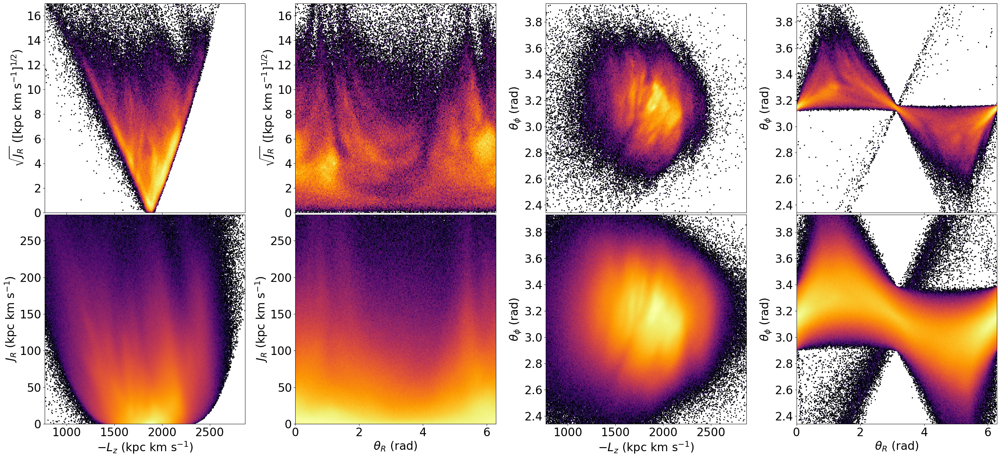

In [6]:
gs=300
ccmap='inferno'
f, ((ax1,ax2,ax3,ax4),(ax5,ax6,ax7,ax8)) = plt.subplots(2, 4, sharex='col',figsize=(36,16))

aalsz=24

d=np.sqrt((gaia['xyz'].value[:,0]+ro)**2+gaia['xyz'].value[:,1]**2+(gaia['xyz'].value[:,2])**2)
f9_indx=d<0.2

ax1.hexbin(-gaia['actions'][:,1].value[f9_indx],np.sqrt(gaia['actions'][:,0].value[f9_indx]),extent=[0.4*ro*vo,1.49*ro*vo,0,17],bins='log',gridsize=gs,cmap=ccmap,rasterized=True,mincnt=1)
ax1.set_xlim([0.4*ro*vo,1.49*ro*vo])
ax1.set_ylim([0,17])
ax0label=ax1.set_ylabel(r'$\sqrt{J_R}\ ([\mathrm{kpc}\ \mathrm{km\ s}^{-1}]^{1/2})$',fontsize=24)
ax2.set_ylabel(r'$\sqrt{J_R}\ ([\mathrm{kpc}\ \mathrm{km\ s}^{-1}]^{1/2})$',fontsize=24)
ax2.hexbin(gaia['angles'][:,0].value[f9_indx],np.sqrt(gaia['actions'][:,0].value[f9_indx]),extent=[0,2.*np.pi,0,17],bins='log',gridsize=gs,cmap=ccmap,rasterized=True,mincnt=1)
ax2.set_xlim([0.,2.*np.pi])
ax2.set_ylim([0,17])
ax3.hexbin(-gaia['actions'][:,1].value[f9_indx],gaia['angles'][:,1].value[f9_indx],extent=[0.4*ro*vo,1.49*ro*vo,np.pi-0.8,np.pi+0.79],bins='log',gridsize=gs,cmap=ccmap,rasterized=True,mincnt=1)
ax3.set_xlim([0.4*ro*vo,1.49*ro*vo])
ax3.set_ylim([np.pi-0.8,0.8+np.pi])
ax5.set_xlabel(r'$-L_z\ (\mathrm{kpc}\ \mathrm{km\ s}^{-1})$',fontsize=24)
ax3.set_ylabel(r'$\theta_{\phi}\ (\mathrm{rad})$',fontsize=24)
ax4.hexbin(gaia['angles'][:,0].value[f9_indx],gaia['angles'][:,1].value[f9_indx],extent=[0,2.*np.pi,np.pi-0.8,np.pi+0.79],gridsize=gs,bins='log',cmap=ccmap,rasterized=True,mincnt=1)
ax4.set_xlim([0.,2.*np.pi])
ax4.set_ylim([np.pi-0.8,0.8+np.pi])
ax6.set_xlabel(r'$\theta_R\ (\mathrm{rad})$',fontsize=24)
ax4.set_ylabel(r'$\theta_{\phi}\ (\mathrm{rad})$',fontsize=24)
ax4.set_ylabel(r'$\theta_{\phi}\ (\mathrm{rad})$',fontsize=24)

f9_indx2=d<2.

ax5.hexbin(-gaia['actions'][:,1].value[f9_indx2],gaia['actions'][:,0].value[f9_indx2],extent=[0.4*ro*vo,1.49*ro*vo,0,17**2],bins='log',gridsize=gs,cmap=ccmap,rasterized=True,mincnt=1)
ax5.set_xlim([0.4*ro*vo,1.49*ro*vo])
ax5.set_ylim([0,16.9**2])
ax5.set_ylabel(r'$J_R\ (\mathrm{kpc}\ \mathrm{km\ s}^{-1})$',fontsize=24)
ax6.set_ylabel(r'$J_R\ (\mathrm{kpc}\ \mathrm{km\ s}^{-1})$',fontsize=24)
ax6.hexbin(gaia['angles'][:,0].value[f9_indx2],gaia['actions'][:,0].value[f9_indx2],extent=[0,2.*np.pi,0,17**2],bins='log',gridsize=gs,cmap=ccmap,rasterized=True,mincnt=1)
ax6.set_xlim([0.,2.*np.pi])
ax6.set_ylim([0,16.9**2])
ax7.hexbin(-gaia['actions'][:,1].value[f9_indx2],gaia['angles'][:,1].value[f9_indx2],extent=[0.4*ro*vo,1.49*ro*vo,np.pi-0.8,np.pi+0.79],bins='log',gridsize=gs,cmap=ccmap,rasterized=True,mincnt=1)
ax7.set_xlim([0.4*ro*vo,1.49*ro*vo])
ax7.set_ylim([np.pi-0.8,0.79+np.pi])
ax7.set_xlabel(r'$-L_z\ (\mathrm{kpc}\ \mathrm{km\ s}^{-1})$',fontsize=aalsz)
ax7.set_ylabel(r'$\theta_{\phi}\ (\mathrm{rad})$',fontsize=aalsz)
ax8.hexbin(gaia['angles'][:,0].value[f9_indx2],gaia['angles'][:,1].value[f9_indx2],extent=[0,2.*np.pi,np.pi-0.8,np.pi+0.79],gridsize=gs,bins='log',cmap=ccmap,rasterized=True,mincnt=1)
ax8.set_xlim([0.,2.*np.pi])
ax8.set_ylim([np.pi-0.8,0.79+np.pi])
ax8.set_xlabel(r'$\theta_R\ (\mathrm{rad})$',fontsize=aalsz)
ax8.set_ylabel(r'$\theta_{\phi}\ (\mathrm{rad})$',fontsize=aalsz)

plt.subplots_adjust(wspace=0.25)
plt.subplots_adjust(hspace=0.01)
ax1.tick_params(axis='both', which='major', labelsize=aalsz)
ax2.tick_params(axis='both', which='major', labelsize=aalsz)
ax3.tick_params(axis='both', which='major', labelsize=aalsz)
ax4.tick_params(axis='both', which='major', labelsize=aalsz)
ax5.tick_params(axis='both', which='major', labelsize=aalsz)
ax6.tick_params(axis='both', which='major', labelsize=aalsz)
ax7.tick_params(axis='both', which='major', labelsize=aalsz)
ax8.tick_params(axis='both', which='major', labelsize=aalsz)

#plt.savefig('fig9_action_angle_space.pdf',bbox_inches='tight')

plt.show()

## Figure 12 (Velocity waves in $R$ and $R_\mathrm{G}$)

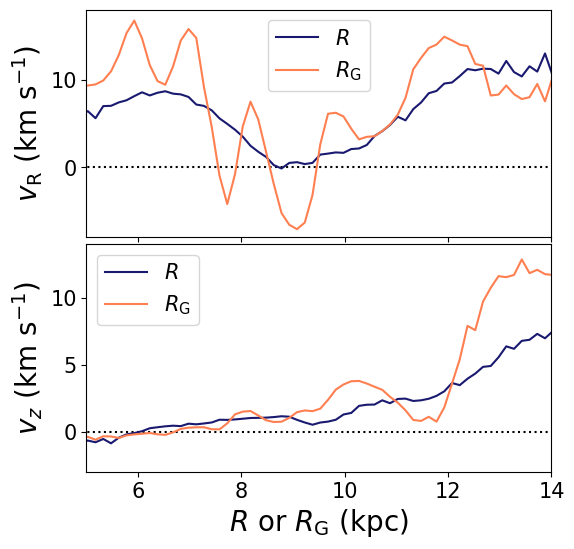

In [7]:
f, ((ax1),(ax2)) = plt.subplots(2, 1,figsize=(6,6), sharex=True)

rcolor='midnightblue'
lzcolor='coral'

f12_indx=(np.fabs(rpz[1]-np.pi)<0.2)*(np.fabs(rpz[2])<1.)

# Require finite actions
ifi=np.isfinite(gaia['actions'][:,1].value)

s2tat,be,bi=binned_statistic(rpz[0][f12_indx],vcyl[0][f12_indx],statistic=np.nanmedian,bins=100,range=[0,15])
s2tat2,be2,bi2=binned_statistic(-gaia['actions'][:,1].value[f12_indx*ifi]/vo,vcyl[0][f12_indx*ifi],statistic=np.nanmedian,bins=100,range=[0,15])
ax1.plot(be[:-1]+(be[1]-be[0])/2.,s2tat,label='$R$',color=rcolor)
ax1.plot(be2[:-1]+(be2[1]-be2[0])/2.,s2tat2,label=r'$R_\mathrm{G}$',color=lzcolor)

stat,be,bi=binned_statistic(rpz[0][f12_indx],vcyl[2][f12_indx],statistic=np.nanmedian,bins=100,range=[0,15])
stat2,be2,bi2=binned_statistic(-gaia['actions'][:,1].value[f12_indx*ifi]/vo,vcyl[2][f12_indx*ifi],statistic=np.nanmedian,bins=100,range=[0,15])
ax2.plot(be[:-1]+(be[1]-be[0])/2.,stat,label='$R$',color=rcolor)
ax2.plot(be2[:-1]+(be2[1]-be2[0])/2.,stat2,label=r'$R_\mathrm{G}$',color=lzcolor)

ax1.set_xlim(5,14)
ax1.legend(fontsize=15)
ax1.set_ylim(-8,18)
ax2.set_xlim(5,14)
ax2.legend(fontsize=15)
ax2.set_ylim(-3,14)
ax1.tick_params(axis='both', which='major', labelsize=15)
ax2.tick_params(axis='both', which='major', labelsize=15)
ax2.set_xlabel(r'$R\ \mathrm{or}\ R_{\mathrm{G}}\ (\mathrm{kpc})$',fontsize=20)
ax1.set_ylabel(r'$v_{\mathrm{R}}\ (\mathrm{km\ s^{-1}})$',fontsize=20)
ax2.set_ylabel(r'$v_z\ (\mathrm{km\ s^{-1}})$',fontsize=20)
plt.subplots_adjust(wspace=0.03)
plt.subplots_adjust(hspace=0.03)

ax1.plot([0,14],[0,0],color='k',ls=':',zorder=0)
ax2.plot([0,14],[0,0],color='k',ls=':',zorder=0)

#plt.savefig('fig12_velocity_waves.pdf',bbox_inches='tight')

plt.show()

## 'Smooth and subtract' plotting function for Figures 13 and 14, adapted from Laporte et al. (2019, MNRAS, 485, 3134)

In [8]:
def plot_snail_colored_by_loc_density(ax,vzdata,zdata,vzbins,zbins,sigma, colorbarlim = [-0.5,0.5],cmaps=cmr.sunburst_r):
    phase_space_spiral, xedges, yedges, bins=binned_statistic_2d(zdata,vzdata,zdata, statistic='count', bins=(zbins, vzbins));
    smoothed_data = nd.gaussian_filter(phase_space_spiral, sigma, order=0,output=None, mode='reflect', cval=0.0, truncate=4.0);
    smoothed2 = nd.gaussian_filter( (phase_space_spiral/smoothed_data)-1, 1,order=0, output=None, mode='reflect', cval=0.0, truncate=4.0);
    im = ax.imshow( smoothed2,  vmin = colorbarlim[0], vmax = colorbarlim[1], extent=[yedges[0],yedges[-1],xedges[0],xedges[-1]],\
               interpolation='gaussian',origin='lower', cmap=cmaps, aspect='equal');
    return im

## Figure 13 (Phase spirals in the Solar neighbourhood)

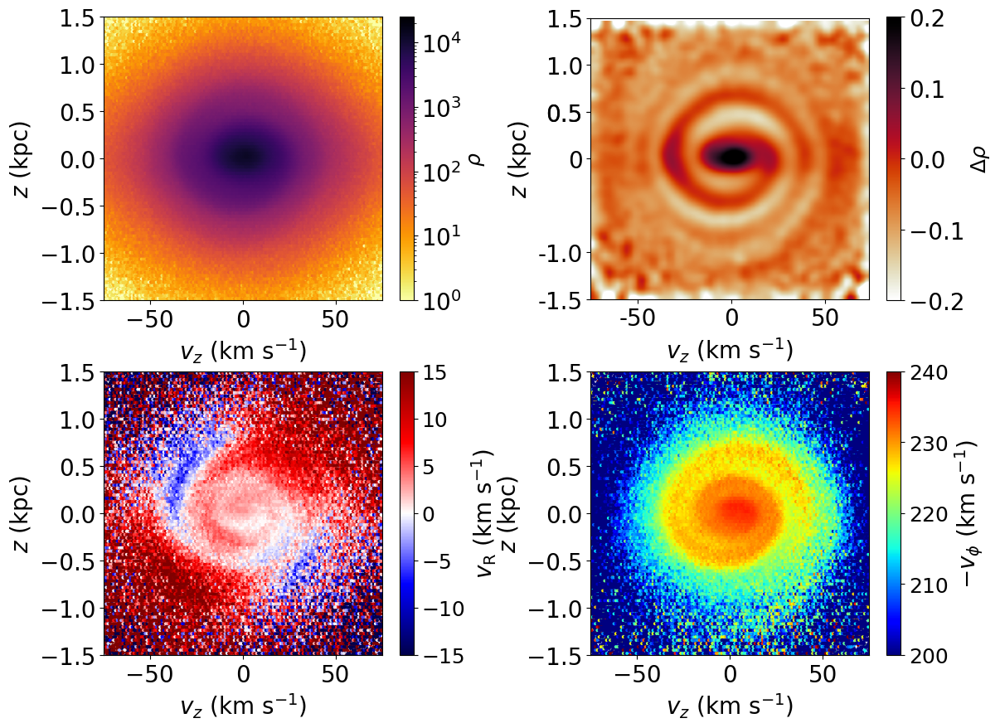

In [9]:
f, ((ax1,ax2),(ax3,ax4)) = plt.subplots(2, 2,figsize=(13,10))

zmin   = -4
zmax   =  4
vzmin  = -4
vzmax  =  4
zstep  = 0.12
vzstep = 0.12
zbins, vzbins = np.arange(zmin, zmax, zstep), np.arange(vzmin, vzmax, vzstep)
sigma, colorbarlim = 2, [-.2,0.2]

gridsi=150

pslsz=20

qindx=(gaia['parallax_error'].value/gaia['parallax'].value<0.15)*(gaia['parallax'].value>0.)
rcyl=np.sqrt((gaia['xyz'].value[:,0]+ro)**2+gaia['xyz'].value[:,1]**2)
rcindx=rcyl<1.

f13_indx=rcindx*qindx

a1=ax1.hexbin(gaia['vxyz'].value[:,2][f13_indx], gaia['xyz'].value[:,2][f13_indx],extent=[-75,75,-1.5,1.5],
           rasterized=True,cmap='inferno_r',mincnt=1,gridsize=gridsi,bins='log',vmin=1,vmax=25000)
ax1.set_xlim(-75,75)
ax1.set_ylim(-1.5,1.5)
cbar1=f.colorbar(a1, ax=ax1)
cbar1.set_label(label=r'$\rho$',fontsize=pslsz-2)
cbar1.ax.tick_params(labelsize=pslsz)
ax1.set_ylabel(r'$z\ (\mathrm{kpc})$',fontsize=pslsz)
ax1.set_xlabel(r'$v_{z}\ (\mathrm{km\ s}^{-1})$',fontsize=pslsz)

a3=ax3.hexbin(gaia['vxyz'].value[:,2][f13_indx], gaia['xyz'].value[:,2][f13_indx],extent=[-75,75,-1.5,1.5],
           rasterized=True,cmap='seismic',gridsize=gridsi,C=vcyl[0][f13_indx],vmin=-15,vmax=15)
ax3.set_xlim(-75,75)
ax3.set_ylim(-1.5,1.5)
cbar3=f.colorbar(a3, ax=ax3)
cbar3.set_label(label=r'$v_{\mathrm{R}}\ (\mathrm{km\ s}^{-1})$',fontsize=pslsz)
cbar3.ax.tick_params(labelsize=pslsz-2)
ax3.set_ylabel(r'$z\ (\mathrm{kpc})$',fontsize=pslsz)
ax3.set_xlabel(r'$v_{z}\ (\mathrm{km\ s}^{-1})$',fontsize=pslsz)

a4=ax4.hexbin(gaia['vxyz'].value[:,2][f13_indx], gaia['xyz'].value[:,2][f13_indx],extent=[-75,75,-1.5,1.5],
           rasterized=True,cmap='jet',gridsize=gridsi,C=-vcyl[1][f13_indx],vmin=200,vmax=240)
ax4.set_xlim(-75,75)
ax4.set_ylim(-1.5,1.5)
cbar4=f.colorbar(a4, ax=ax4)
cbar4.set_label(label=r'$-v_{\phi}\ (\mathrm{km\ s}^{-1})$',fontsize=pslsz)
cbar4.ax.tick_params(labelsize=pslsz-2)
ax4.set_ylabel(r'$z\ (\mathrm{kpc})$',fontsize=pslsz)
ax4.set_xlabel(r'$v_{z}\ (\mathrm{km\ s}^{-1})$',fontsize=pslsz)

plt.subplots_adjust(wspace=0.4)
plt.subplots_adjust(hspace=0.25)

# Scaling only used for equal ratio in gaussian smoothing
zscale = (75./4.)
vzscale = (1.5/4.)

a2 = plot_snail_colored_by_loc_density(ax2,gaia['vxyz'].value[:,2][f13_indx]/zscale, gaia['xyz'].value[:,2][f13_indx]/vzscale, vzbins,zbins,sigma, colorbarlim)

ax2.set_ylabel(r'$z\ (\mathrm{kpc})$',fontsize=pslsz)
ax2.set_xlabel(r'$v_{z}\ (\mathrm{km\ s}^{-1})$',fontsize=pslsz)
ax2.tick_params(axis='both', labelsize=pslsz)
ax2.set_xticks([-50./zscale,0.,50./zscale])
ax2.set_yticks([-1.5/vzscale,-1./vzscale,0.5/vzscale,0.,0.5/vzscale,1./vzscale,1.5/vzscale])
ax2.set_xticklabels([-50,0,50])
ax2.set_yticklabels([-1.5,-1.0,-0.5,0,0.5,1.0,1.5])

cbar2=f.colorbar(a2, ax=ax2)
cbar2.set_label(label=r'$\Delta\rho$',fontsize=pslsz-2)
cbar2.ax.tick_params(labelsize=pslsz)


ax1.tick_params(axis='both', which='major', labelsize=pslsz)
ax2.tick_params(axis='both', which='major', labelsize=pslsz)
ax3.tick_params(axis='both', which='major', labelsize=pslsz)
ax4.tick_params(axis='both', which='major', labelsize=pslsz)

#plt.savefig('fig13_phase_spiral_local.pdf',bbox_inches='tight')

plt.show()

## Figure 14 (Phase spirals split by $R_\mathrm{G}$ and $\theta_\phi$)

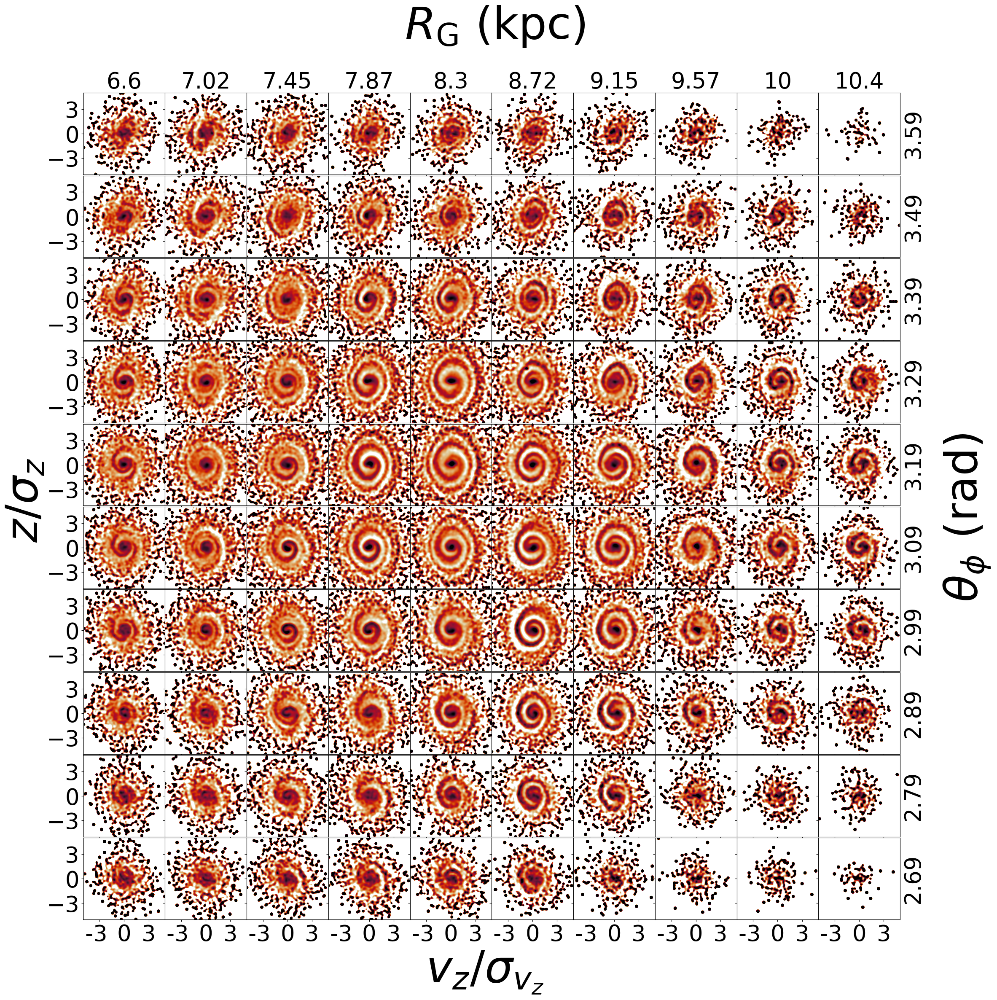

In [13]:
warnings.filterwarnings('ignore')

zmin   = -5
zmax   =  5
vzmin  = -5
vzmax  =  5
zstep  = 0.12
vzstep = 0.12
zbins, vzbins = np.arange(zmin, zmax, zstep), np.arange(vzmin, vzmax, vzstep)
sigma, colorbarlim = 2., [-.2,0.2]

rcjp=np.sqrt((gaia['xyz'].value[:,0]+ro)**2+gaia['xyz'].value[:,1]**2)
rcjpindx=rcjp<1.

fss=38

rows=10
columns=10

fig, ax_array = plt.subplots(rows, columns, figsize=(25,25.5),sharex='col',sharey='row')
for k,ax_row in enumerate(ax_array):
    for j,axes in enumerate(ax_row):

        jphiindx=(-gaia['actions'][:,1].value>1400+(j+1)*100.)*(-gaia['actions'][:,1].value<1500.+(j+1)*100.) 
        theta_phi_indx=(gaia['angles'][:,1].value<np.pi+0.6-0.1*(k+1))*(gaia['angles'][:,1].value>np.pi+0.6-0.1*(k+2))
        f14_indx=jphiindx*theta_phi_indx*rcjpindx

        axes.set_xlim(-5,5)
        axes.set_ylim(-5,5)
        axes.tick_params(axis='both', labelsize=fss)
        im = plot_snail_colored_by_loc_density(axes,
            gaia['vxyz'].value[:,2][f14_indx]/np.std(gaia['vxyz'].value[:,2][f14_indx]),
            gaia['xyz'].value[:,2][f14_indx]/np.std(gaia['xyz'].value[:,2][f14_indx]),
            vzbins,zbins,sigma, colorbarlim,cmr.sunburst_r)            
        
        if j==0:
            axes.set_yticks([-3,0,3])
        if j==0 and k==9:
            axes.set_yticks([-3,0,3])
            
        if k==0:
            if j==0:
                axes.set_title(str("{0:.3g}".format((1450+(j+1)*100.)/vo)),fontsize=fss)
            if j==1:
                axes.set_title(str("{0:.3g}".format((1450+(j+1)*100.)/vo)),fontsize=fss)
            if j==2:
                axes.set_title(str("{0:.3g}".format((1450+(j+1)*100.)/vo)),fontsize=fss)
            if j==3: 
                axes.set_title(str("{0:.3g}".format((1450+(j+1)*100.)/vo)),fontsize=fss)
            if j==4:     
                axes.set_title(str("{0:.3g}".format((1450+(j+1)*100.)/vo)),fontsize=fss)
            if j==5:     
                axes.set_title(str("{0:.3g}".format((1450+(j+1)*100.)/vo)),fontsize=fss)
            if j==6:     
                axes.set_title(str("{0:.3g}".format((1450+(j+1)*100.)/vo)),fontsize=fss)
            if j==7:     
                axes.set_title(str("{0:.3g}".format((1450+(j+1)*100.)/vo)),fontsize=fss)
            if j==8:     
                axes.set_title(str("{0:.3g}".format((1450+(j+1)*100.)/vo)),fontsize=fss)
            if j==9:     
                axes.set_title(str("{0:.3g}".format((1450+(j+1)*100.)/vo)),fontsize=fss)      
            
        if k==9:
            axes.set_xticks([-3,0,3])
            axes.set_xticklabels(['-3 ',0,3])
        if k==9 and j==0:
            axes.set_xticks([-3,0,3])
            axes.set_xticklabels(['-3 ',0,3])
            
        if j==9:
            axes.yaxis.set_label_position("right")
            if k==0:
                axes.set_ylabel(str("{0:.3g}".format(np.pi+0.6-0.1*(k+1.5))),fontsize=fss)
            if k==1: 
                axes.set_ylabel(str("{0:.3g}".format(np.pi+0.6-0.1*(k+1.5))),fontsize=fss)
            if k==2:
                axes.set_ylabel(str("{0:.3g}".format(np.pi+0.6-0.1*(k+1.5))),fontsize=fss)
            if k==3: 
                axes.set_ylabel(str("{0:.3g}".format(np.pi+0.6-0.1*(k+1.5))),fontsize=fss)
            if k==4:     
                axes.set_ylabel(str("{0:.3g}".format(np.pi+0.6-0.1*(k+1.5))),fontsize=fss)
            if k==5:     
                axes.set_ylabel(str("{0:.3g}".format(np.pi+0.6-0.1*(k+1.5))),fontsize=fss)
            if k==6:     
                axes.set_ylabel(str("{0:.3g}".format(np.pi+0.6-0.1*(k+1.5))),fontsize=fss)
            if k==7:     
                axes.set_ylabel(str("{0:.3g}".format(np.pi+0.6-0.1*(k+1.5))),fontsize=fss)
            if k==8:     
                axes.set_ylabel(str("{0:.3g}".format(np.pi+0.6-0.1*(k+1.5))),fontsize=fss)
            if k==9:     
                axes.set_ylabel(str("{0:.3g}".format(np.pi+0.6-0.1*(k+1.5))),fontsize=fss)
plt.subplots_adjust(wspace=0.)
plt.subplots_adjust(hspace=0.)

plt.figtext(0.45, 0.052, r'$v_z/\sigma_{v_z}$', fontsize=fss*2,color='k')#
plt.figtext(0.43, 0.93, r'$R_{\mathrm{G}}\ (\mathrm{kpc})$', fontsize=fss*2,color='k')
plt.figtext(0.05, 0.47, r'$z/\sigma_{z}$', fontsize=fss*2,color='k',rotation='vertical')
plt.figtext(0.94, 0.42, r'$\theta_{\phi}\ (\mathrm{rad})$', fontsize=fss*2,color='k',rotation='vertical')

plt.savefig('fig14_phase_spiral_across_disc.pdf',bbox_inches='tight')

plt.show()